# HydraNets for Autonomous Driving 🚗

In this project, we build a Neural Network that takes an:
* Input: **a monocular RGB Image**
* Output: **a Depth Map**, and **a Segmentation Map**

A single model, two different outputs. For that, out model will need to use a principle called Multi Task Learning.<p>

This notebook only demonstrates the inference process for the Hydranet. Training is done on the NYUDv2 dataset on a separate notebook.

# 1 - Imports

In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np
import cv2
import torch
import torch.nn as nn
import math
import torch.nn.functional as F
from torch.autograd import Variable

from lib.network.hydranet_autonomous_car import HydraNet

## Creating the HydraNet
We now have 2 DataLoaders: one for training, and one for validation/test. <p>

In the next step, we're going to define our model, following the paper [Real-Time Joint Semantic Segmentation and Depth Estimation Using Asymmetric Annotations](https://arxiv.org/pdf/1809.04766.pdf) —— If you haven't read it yet, now is the time.<p>

A Note — This notebook has been adapted from DrSleep, a researcher named Vladimir, who authorized me to adapt it for education purposes. [Here's the notebook I'm refering to](https://github.com/DrSleep/multi-task-refinenet/blob/master/src/notebooks/ExpNYUDKITTI_joint.ipynb/).

<p>

> ![](https://d3i71xaburhd42.cloudfront.net/435d4b5c30f10753d277848a17baddebd98d3c31/2-Figure1-1.png)

Our model takes an input RGB image, make it go through an encoder, a lightweight refinenet decoder, and then has 2 heads, one for each task.<p>
Things to note:
* The only **convolutions** we'll need will be 3x3 and 1x1
* We also need a **MaxPooling 5x5**
* **CRP-Blocks** are implemented as Skip-Connection Operations
* **Each Head is made of a 1x1 convolution followed by a 3x3 convolution**, only the data and the loss change there


In [2]:
hydranet = HydraNet()
hydranet.define_mobilenet()
hydranet.define_lightweight_refinenet()

# Run the Model

## Load the Model Weights

In [9]:
if torch.cuda.is_available():
    _ = hydranet.cuda()
_ = hydranet.eval()

In [10]:
ckpt = torch.load('models/ExpKITTI_joint.ckpt')
hydranet.load_state_dict(ckpt['state_dict'])

<All keys matched successfully>

## Preprocess Images

In [11]:
IMG_SCALE  = 1./255
IMG_MEAN = np.array([0.485, 0.456, 0.406]).reshape((1, 1, 3))
IMG_STD = np.array([0.229, 0.224, 0.225]).reshape((1, 1, 3))

def prepare_img(img):
    return (img * IMG_SCALE - IMG_MEAN) / IMG_STD

## Load and Run an Image

In [12]:
# Pre-processing and post-processing constants #
CMAP = np.load('cmaps/cmap_kitti.npy')
NUM_CLASSES = 6

In [13]:
print(CMAP)

[[128 128 128]
 [128   0   0]
 [128  64 128]
 [  0   0 192]
 [128 128   0]
 [ 64   0 128]
 [  0   0   0]]


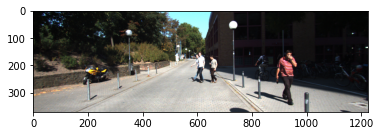

In [14]:
import glob
images_files = glob.glob('data/*.png')
idx = np.random.randint(0, len(images_files))

img_path = images_files[idx]
img = np.array(Image.open(img_path))
plt.imshow(img)
plt.show()

In [15]:
def pipeline(img):
    with torch.no_grad():
      #Converting to the correct colorspace
        img_var = Variable(torch.from_numpy(prepare_img(img).transpose(2,0,1)[None]), requires_grad=False).float()
        if torch.cuda.is_available():
            img_var = img_var.cuda()
        segm, depth = hydranet(img_var)
        segm = cv2.resize(segm[0,:NUM_CLASSES].cpu().data.numpy().transpose(1,2,0),
                          img.shape[:2][::-1],
                          interpolation=cv2.INTER_CUBIC)
        depth = cv2.resize(depth[0,0].cpu().data.numpy(),
                          img.shape[:2][::-1],
                          interpolation=cv2.INTER_CUBIC)
        segm = CMAP[segm.argmax(axis=2)].astype(np.uint8)
        depth = np.abs(depth)
        return depth, segm

In [16]:
depth, segm = pipeline(img)

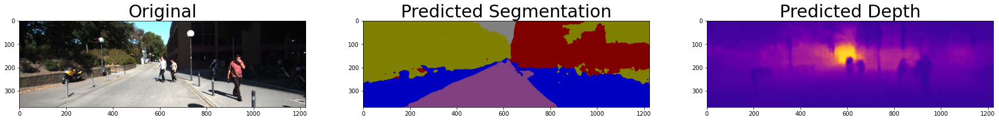

In [17]:
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(30,20))
ax1.imshow(img)
ax1.set_title('Original', fontsize=30)
ax2.imshow(segm)
ax2.set_title('Predicted Segmentation', fontsize=30)
ax3.imshow(depth, cmap="plasma", vmin=0, vmax=80)
ax3.set_title("Predicted Depth", fontsize=30)
plt.show()

## Run on a Video

In [18]:
print(img.shape)
print(depth.shape)
print(segm.shape)

(370, 1224, 3)
(370, 1224)
(370, 1224, 3)


(370, 1224, 3)


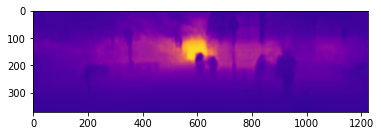

In [19]:
import matplotlib.cm as cm
import matplotlib.colors as co

def depth_to_rgb(depth):
    normalizer = co.Normalize(vmin=0, vmax=80)
    mapper = cm.ScalarMappable(norm=normalizer, cmap='plasma')
    colormapped_im = (mapper.to_rgba(depth)[:, :, :3] * 255).astype(np.uint8)
    return colormapped_im

depth_rgb = depth_to_rgb(depth)
print(depth_rgb.shape)
plt.imshow(depth_rgb)
plt.show()

(370, 1224, 3)
(370, 1224, 3)
(370, 1224, 3)


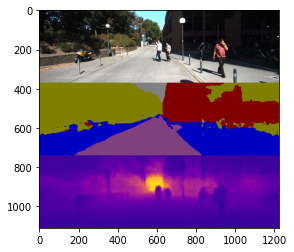

In [20]:
print(img.shape)
print(depth_rgb.shape)
print(segm.shape)
new_img = np.vstack((img, segm, depth_rgb))
plt.imshow(new_img)
plt.show()

In [22]:
video_files = sorted(glob.glob("data/*.png"))

# Build a HydraNet
hydranet = HydraNet()
hydranet.define_mobilenet()
hydranet.define_lightweight_refinenet()

# Set the Model to Eval on GPU
if torch.cuda.is_available():
    _ = hydranet.cuda()
_ = hydranet.eval()

# Load the Weights
ckpt = torch.load('models/ExpKITTI_joint.ckpt')
hydranet.load_state_dict(ckpt['state_dict'])

# Run the pipeline
result_video = []
for idx, img_path in enumerate(video_files):
    image = np.array(Image.open(img_path))
    h, w, _ = image.shape 
    depth, seg = pipeline(image)
    result_video.append(cv2.cvtColor(cv2.vconcat([image, seg, depth_to_rgb(depth)]), cv2.COLOR_BGR2RGB))

out = cv2.VideoWriter('output/out.mp4',cv2.VideoWriter_fourcc(*'MP4V'), 15, (w,3*h))

for i in range(len(result_video)):
    out.write(result_video[i])
out.release()

In [23]:
from IPython.display import HTML
from base64 import b64encode
mp4 = open('output/out.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=800 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

## 3D Segmentation

Did you ever wonder... How is segmentation used in self-driving cars? Like, **once you have the map, what do you do with it**?
3D Segmentation is performed by Fusing a Depth Map with a Segmentation Map!


In [25]:
import open3d as o3d

Jupyter environment detected. Enabling Open3D WebVisualizer.
[Open3D INFO] WebRTC GUI backend enabled.
[Open3D INFO] WebRTCWindowSystem: HTTP handshake server disabled.


In [26]:
o3d.__version__

'0.14.1'

### RGBD - Fuse the RGB Image and the Depth Map

The first thing we'll implement is to create an RGBD Image by fusing the RGB Image with the Depth Map. For that, we'll use [Open3D's Class RGBD Image](http://www.open3d.org/docs/release/python_api/open3d.geometry.RGBDImage.html) and the function create_from_color_and_depth(color, depth).<p>
It looks pretty straghtforward, we just need to make sure that the image are loaded as [Open3D Images](http://www.open3d.org/docs/release/python_api/open3d.geometry.Geometry.html?highlight=image#open3d.geometry.Geometry.Image).

In [28]:
rgbd = o3d.geometry.RGBDImage.create_from_color_and_depth(o3d.io.read_image(img_path), o3d.geometry.Image(depth), 
                                                          convert_rgb_to_intensity=False)

Next, we'll use the function create_from_rgbd_image to build a Point Cloud based on this. For that, we'll need the camera's intrinsic parameters

In [29]:
intrinsics = o3d.camera.PinholeCameraIntrinsic(width = 1242, height = 375, fx = 721., fy = 721., cx = 609., cy = 609.)

In [30]:
point_cloud = o3d.geometry.PointCloud.create_from_rgbd_image(rgbd, intrinsics)
o3d.io.write_point_cloud("test.pcd", point_cloud)

True

### 3D Segmentation — Fuse the Segmentation Map with the Depth Map
From now on, the process is exactly the same. But instead of creating a Point Cloud from an RGBD Image with the Normal RGB Image, we'll do it with the Depth Map.

In [31]:
rgbd = o3d.geometry.RGBDImage.create_from_color_and_depth(o3d.geometry.Image(segm), o3d.geometry.Image(depth), 
                                                          convert_rgb_to_intensity=False)

In [32]:
point_cloud = o3d.geometry.PointCloud.create_from_rgbd_image(rgbd, intrinsics)

In [33]:
o3d.io.write_point_cloud("test_segm.pcd", point_cloud)

True

In [ ]:
pcd = o3d.io.read_point_cloud("test_segm.pcd")
o3d.visualization.draw_geometries([pcd],
                                  zoom=0.3412,
                                  front=[0.4257, -0.2125, -0.8795],
                                  lookat=[2.6172, 2.0475, 1.532],
                                  up=[-0.0694, -0.9768, 0.2024])